Loading the original image

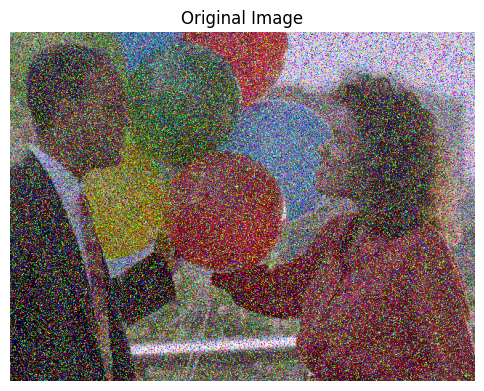

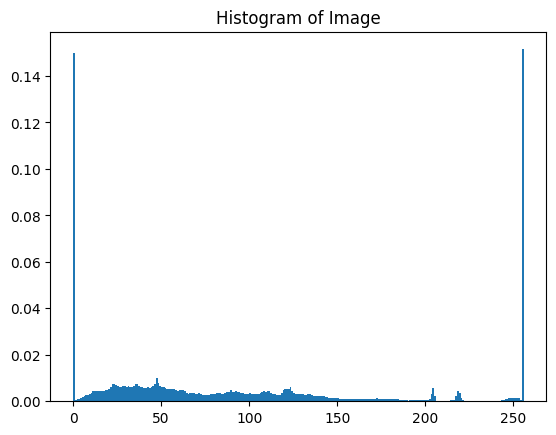

Image size: (480, 640, 3)


In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

image_path = "/content/balloons_noisy (1).png"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
h, w = image.shape[:2]
even_h = h - h % 2
even_w = w - w % 2
image = cv2.resize(image, (even_w, even_h), interpolation=cv2.INTER_AREA)
plt.figure(figsize=(6,6))
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")
plt.show()
plt.hist(image.ravel(), bins=256, range=[0,256], density=True)
plt.title("Histogram of Image")
plt.show()
print("Image size:", image.shape)
original_shape = image.shape[:2]


Downsampling the image

Downsampled image size: (240, 320, 3)


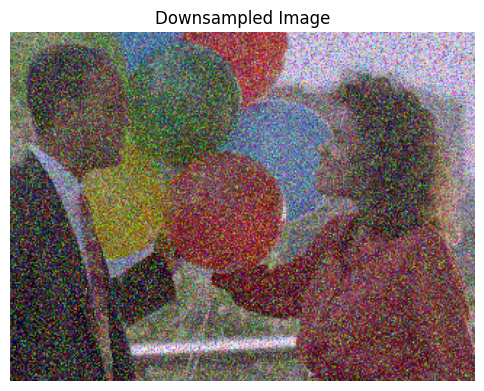

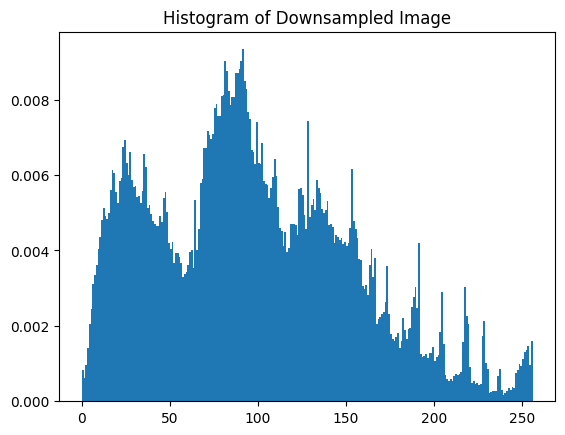

In [3]:

scale_percent = 50
width = int(image.shape[1] * scale_percent / 100)
height = int(image.shape[0] * scale_percent / 100)
downsampled = cv2.resize(image, (width, height), interpolation=cv2.INTER_AREA)
print("Downsampled image size:", downsampled.shape)
plt.figure(figsize=(6,6))
plt.imshow(downsampled)
plt.title("Downsampled Image")
plt.axis("off")
plt.show()
plt.hist(downsampled.ravel(), bins=256, range=[0,256], density=True)
plt.title("Histogram of Downsampled Image")
plt.show()


Denoising

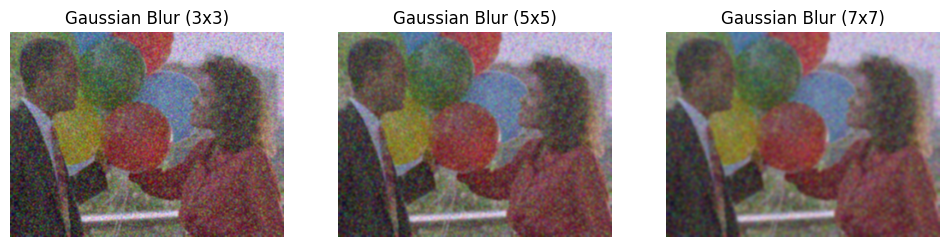

In [4]:
# Gaussian filtering
denoised_image_3x3 = cv2.GaussianBlur(downsampled, (3, 3), 0)  # Smaller blur
denoised_image_5x5 = cv2.GaussianBlur(downsampled, (5, 5), 0)
denoised_image_7x7 = cv2.GaussianBlur(downsampled, (7, 7), 0)  # Stronger blur

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(denoised_image_3x3)
plt.title("Gaussian Blur (3x3)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(denoised_image_5x5)
plt.title("Gaussian Blur (5x5)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(denoised_image_7x7)
plt.title("Gaussian Blur (7x7)")
plt.axis("off")
plt.show()


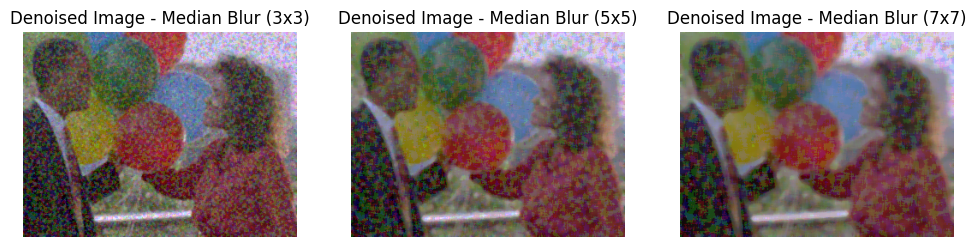

In [5]:
# Apply Median Filtering
denoised_3x3 = cv2.medianBlur(downsampled, 3)
denoised_5x5 = cv2.medianBlur(downsampled, 5)
denoised_7x7 = cv2.medianBlur(downsampled, 7)

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(denoised_3x3)
plt.title("Denoised Image - Median Blur (3x3)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(denoised_5x5)
plt.title("Denoised Image - Median Blur (5x5)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(denoised_7x7)
plt.title("Denoised Image - Median Blur (7x7)")
plt.axis("off")
plt.show()


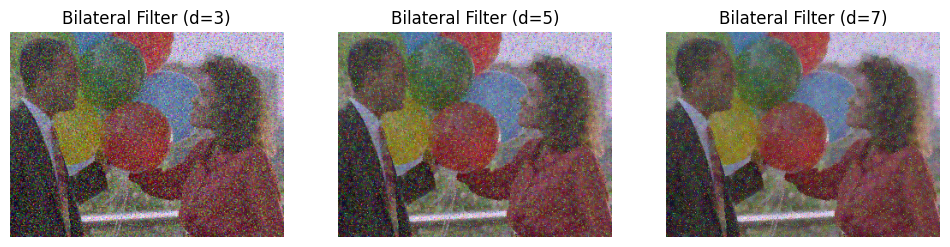

In [6]:
# Apply Bilateral Filtering
bilateral_small = cv2.bilateralFilter(downsampled, 3, 75, 75)  # Smaller smoothing
bilateral_moderate = cv2.bilateralFilter(downsampled, 5, 75, 75)
bilateral_strong = cv2.bilateralFilter(downsampled, 7, 75, 75)  # Strong smoothing

plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(bilateral_small)
plt.title("Bilateral Filter (d=3)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(bilateral_moderate)
plt.title("Bilateral Filter (d=5)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(bilateral_strong)
plt.title("Bilateral Filter (d=7)")
plt.axis("off")
plt.show()


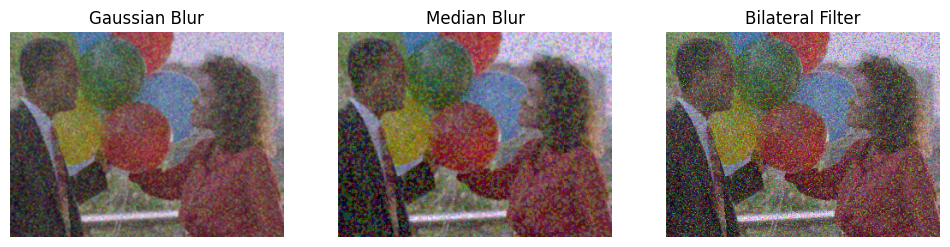

In [7]:
gaussian = cv2.GaussianBlur(downsampled, (3, 3), 0)
median = cv2.medianBlur(downsampled, 3)
bilateral = cv2.bilateralFilter(downsampled, 3, 75, 75)

plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(gaussian)
plt.title("Gaussian Blur")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(median)
plt.title("Median Blur")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(bilateral)
plt.title("Bilateral Filter")
plt.axis("off")
plt.show()


In [8]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

gaussian_up = cv2.resize(gaussian, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_CUBIC)
median_up = cv2.resize(median, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_CUBIC)
bilateral_up = cv2.resize(bilateral, (image.shape[1], image.shape[0]), interpolation=cv2.INTER_CUBIC)
filters = {
    'Gaussian': gaussian_up,
    'Median': median_up,
    'Bilateral': bilateral_up
}
best_ssim = -1
best_filter_name = ""
final_denoised_image = None
for name, fimg in filters.items():
    psnr_val = psnr(image, fimg)
    ssim_val = ssim(image, fimg, channel_axis=-1)
    print(f"{name} → PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

    if ssim_val > best_ssim:
        best_ssim = ssim_val
        best_filter_name = name
print(f"Best filter based on SSIM: {best_filter_name} (SSIM: {best_ssim:.4f})")

if best_filter_name == "Gaussian":
    final_denoised_image = gaussian
elif best_filter_name == "Median":
    final_denoised_image = median
else:
    final_denoised_image = bilateral


Gaussian → PSNR: 10.71 dB, SSIM: 0.1059
Median → PSNR: 10.36 dB, SSIM: 0.0604
Bilateral → PSNR: 11.17 dB, SSIM: 0.2433
Best filter based on SSIM: Bilateral (SSIM: 0.2433)


In [ ]:
#final_denoised_image = median

Comparison of manual and inbuilt interpolation  methods


In [9]:
import numpy as np

def manual_nearest_neighbor(image, scale):
    h, w, c = image.shape
    new_h, new_w = int(h * scale), int(w * scale)
    output = np.zeros((new_h, new_w, c), dtype=image.dtype)
    for i in range(new_h):
        for j in range(new_w):
            orig_i = int(i / scale)
            orig_j = int(j / scale)
            output[i, j] = image[orig_i, orig_j]
    return output

manual_upscaled = manual_nearest_neighbor(final_denoised_image, scale=2)
inbuilt_upscaled = cv2.resize(final_denoised_image, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_NEAREST)


Manual Nearest Neighbor 
  PSNR: 11.387953095809522
  SSIM: 0.29614640484288207
Inbuilt Nearest Neighbor 
  PSNR: 11.387953095809522
  SSIM: 0.29614640484288207


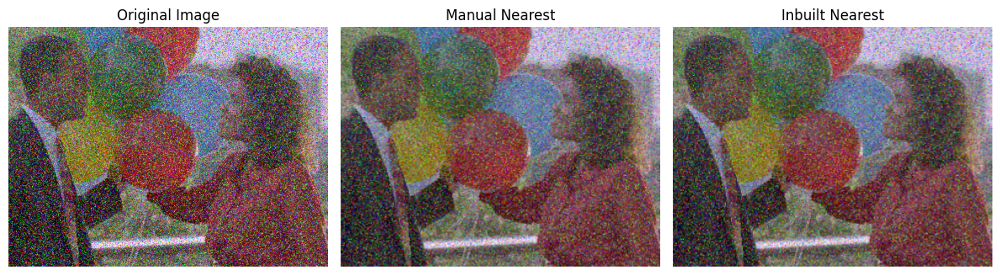

In [10]:
if manual_upscaled.shape != image.shape:
    image_resized = cv2.resize(image, (manual_upscaled.shape[1], manual_upscaled.shape[0]), interpolation=cv2.INTER_CUBIC)
else:
    image_resized = image

print("Manual Nearest Neighbor ")
print("  PSNR:", psnr(image_resized, manual_upscaled))
print("  SSIM:", ssim(image_resized, manual_upscaled, channel_axis=-1))
print("Inbuilt Nearest Neighbor ")
print("  PSNR:", psnr(image_resized, inbuilt_upscaled))
print("  SSIM:", ssim(image_resized, inbuilt_upscaled, channel_axis=-1))

plt.figure(figsize=(12,4))
plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(manual_upscaled)
plt.title("Manual Nearest")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(inbuilt_upscaled)
plt.title("Inbuilt Nearest")
plt.axis("off")

plt.tight_layout()
plt.show()


In [72]:
def manual_bilinear_interpolation(image, scale):
    h, w, c = image.shape
    new_h, new_w = int(h * scale), int(w * scale)
    output = np.zeros((new_h, new_w, c), dtype=np.uint8)
    for i in range(new_h):
        for j in range(new_w):
            x = i / scale
            y = j / scale
            x0 = int(np.floor(x))
            x1 = min(x0 + 1, h - 1)
            y0 = int(np.floor(y))
            y1 = min(y0 + 1, w - 1)
            a = x - x0
            b = y - y0
            for ch in range(c):
                top = (1 - b) * image[x0, y0, ch] + b * image[x0, y1, ch]
                bottom = (1 - b) * image[x1, y0, ch] + b * image[x1, y1, ch]
                value = (1 - a) * top + a * bottom
                output[i, j, ch] = np.clip(value, 0, 255)
    return output

manual_bilinear = manual_bilinear_interpolation(final_denoised_image, scale=2)
inbuilt_bilinear = cv2.resize(final_denoised_image, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_LINEAR)


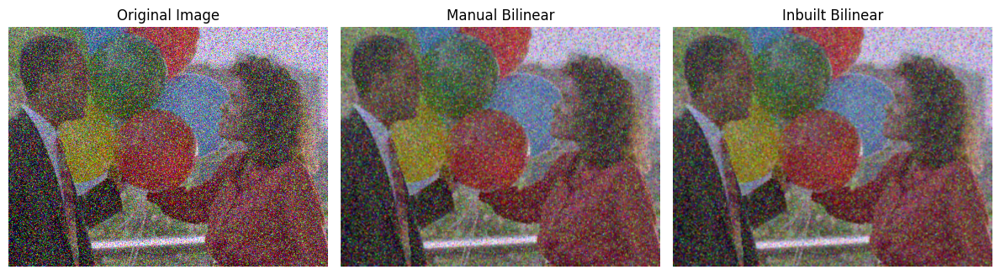

In [73]:
if manual_bilinear.shape != image.shape:
    image_resized = cv2.resize(image, (manual_bilinear.shape[1], manual_bilinear.shape[0]), interpolation=cv2.INTER_CUBIC)
else:
    image_resized = image

#print("Manual Bilinear Interpolation")
#print("  PSNR:", psnr(image_resized, manual_bilinear))
#print("  SSIM:", ssim(image_resized, manual_bilinear, channel_axis=-1))
#print("Inbuilt Bilinear Interpolation")
#print("  PSNR:", psnr(image_resized, inbuilt_bilinear))
#print("  SSIM:", ssim(image_resized, inbuilt_bilinear, channel_axis=-1))
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(manual_bilinear)
plt.title("Manual Bilinear")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(inbuilt_bilinear)
plt.title("Inbuilt Bilinear")
plt.axis("off")
plt.tight_layout()
plt.show()


In [74]:
def cubic_weight(t, a=-0.5):
    abs_t = np.abs(t)
    abs_t2 = abs_t ** 2
    abs_t3 = abs_t ** 3
    if abs_t <= 1:
        return (a + 2) * abs_t3 - (a + 3) * abs_t2 + 1
    elif 1 < abs_t < 2:
        return a * abs_t3 - 5 * a * abs_t2 + 8 * a * abs_t - 4 * a
    else:
        return 0

def manual_bicubic_interpolation(image, scale):
    h, w, c = image.shape
    new_h, new_w = int(h * scale), int(w * scale)
    output = np.zeros((new_h, new_w, c), dtype=np.uint8)
    for i in range(new_h):
        for j in range(new_w):
            x = i / scale
            y = j / scale
            x_int = int(np.floor(x))
            y_int = int(np.floor(y))
            for ch in range(c):
                value = 0.0
                for m in range(-1, 3):
                    for n in range(-1, 3):
                        xm = np.clip(x_int + m, 0, h - 1)
                        yn = np.clip(y_int + n, 0, w - 1)
                        weight = cubic_weight(x - (x_int + m)) * cubic_weight(y - (y_int + n))
                        value += image[xm, yn, ch] * weight
                output[i, j, ch] = np.clip(value, 0, 255)
    return output
manual_bicubic = manual_bicubic_interpolation(final_denoised_image, scale=2)
inbuilt_bicubic = cv2.resize(final_denoised_image, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_CUBIC)


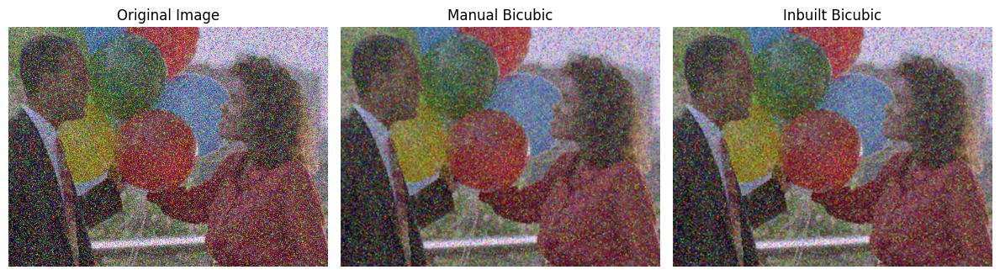

In [75]:
if manual_bicubic.shape != image.shape:
    image_resized = cv2.resize(image, (manual_bicubic.shape[1], manual_bicubic.shape[0]), interpolation=cv2.INTER_CUBIC)
else:
    image_resized = image

#print("Manual Bicubic Interpolation")
#print("  PSNR:", psnr(image_resized, manual_bicubic))
#print("  SSIM:", ssim(image_resized, manual_bicubic, channel_axis=-1))
#print("Inbuilt Bicubic Interpolation")
#print("  PSNR:", psnr(image_resized, inbuilt_bicubic))
#print("  SSIM:", ssim(image_resized, inbuilt_bicubic, channel_axis=-1))
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(manual_bicubic)
plt.title("Manual Bicubic")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(inbuilt_bicubic)
plt.title("Inbuilt Bicubic")
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
def sinc(x):
    return np.sinc(x)

def lanczos_kernel(x, a):
    if x == 0:
        return 1
    elif -a < x < a:
        return sinc(x) * sinc(x / a)
    else:
        return 0

def manual_lanczos_interpolation(image, scale, a=3):
    h, w, c = image.shape
    new_h, new_w = int(h * scale), int(w * scale)
    output = np.zeros((new_h, new_w, c), dtype=np.float64)

    for i in range(new_h):
        for j in range(new_w):
            x = (i + 0.5) / scale - 0.5
            y = (j + 0.5) / scale - 0.5
            x_int = int(np.floor(x))
            y_int = int(np.floor(y))
            for ch in range(c):
                value = 0.0
                norm = 0.0
                for m in range(-a, a + 1):
                    for n in range(-a, a + 1):
                        xm = np.clip(x_int + m, 0, h - 1)
                        yn = np.clip(y_int + n, 0, w - 1)
                        weight_x = lanczos_kernel(x - (x_int + m), a)
                        weight_y = lanczos_kernel(y - (y_int + n), a)
                        weight = weight_x * weight_y
                        norm += weight
                        value += image[xm, yn, ch] * weight
                if norm != 0:
                    value /= norm
                output[i, j, ch] = value

    return np.clip(output, 0, 255).astype(np.uint8)

inbuilt_lanczos = cv2.resize(final_denoised_image, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_LANCZOS4)
manual_lanczos = manual_lanczos_interpolation(final_denoised_image, scale=2)


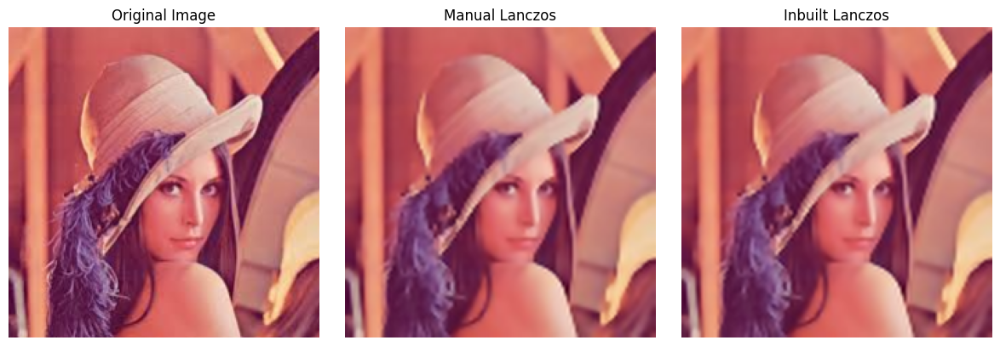

In [ ]:
if manual_lanczos.shape != image.shape:
    image_resized = cv2.resize(image, (manual_lanczos.shape[1], manual_lanczos.shape[0]), interpolation=cv2.INTER_CUBIC)
else:
    image_resized = image
#print("Manual Lanczos Interpolation")
#print("  PSNR:", psnr(image_resized, manual_lanczos))
#print("  SSIM:", ssim(image_resized, manual_lanczos, channel_axis=-1))
#print("Inbuilt Lanczos Interpolation")
#print("  PSNR:", psnr(image_resized, inbuilt_lanczos))
#print("  SSIM:", ssim(image_resized, inbuilt_lanczos, channel_axis=-1))
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(manual_lanczos)
plt.title("Manual Lanczos")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(inbuilt_lanczos)
plt.title("Inbuilt Lanczos")
plt.axis("off")
plt.tight_layout()
plt.show()


Different interpolaton methods

In [ ]:
final_denoised_image=downsampled

Image Sizes:
Original: 340x220
Downsampled: 170x110
Denoised: 170x110
Nearest: 340x220
Bilinear: 340x220
Bicubic: 340x220
Lanczos: 340x220
Spline: 340x220


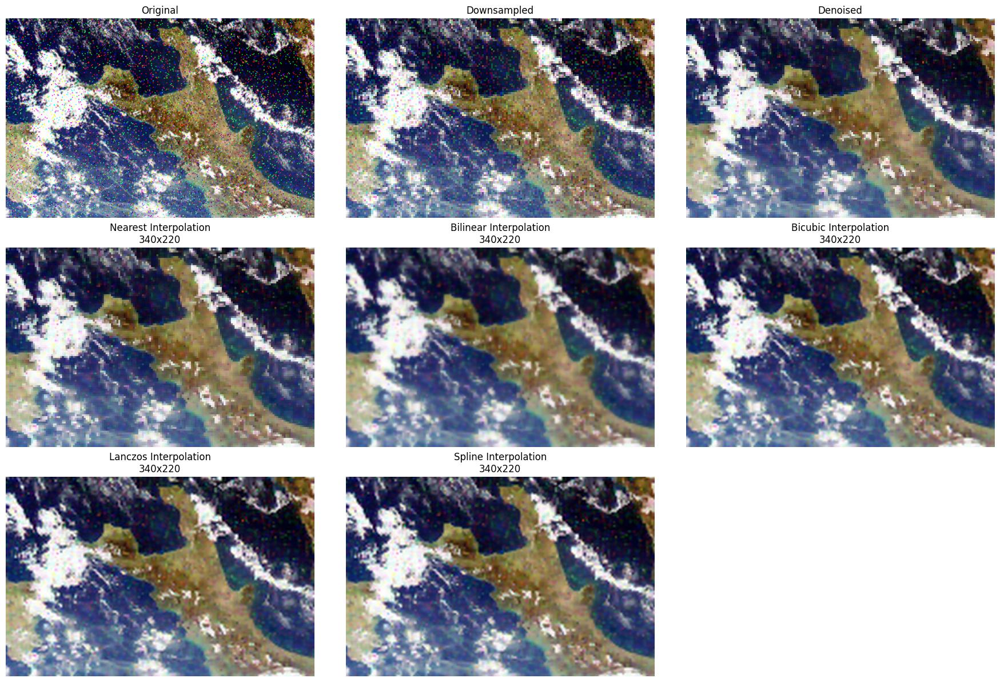

In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

scale = 2
nearest = cv2.resize(final_denoised_image, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_NEAREST)
bilinear = cv2.resize(final_denoised_image, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
bicubic = cv2.resize(final_denoised_image, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_CUBIC)
lanczos = cv2.resize(final_denoised_image, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_LANCZOS4)
spline = zoom(final_denoised_image, (scale, scale, 1), order=3)

print("Image Sizes:")
print(f"Original: {image.shape[1]}x{image.shape[0]}")
print(f"Downsampled: {downsampled.shape[1]}x{downsampled.shape[0]}")
print(f"Denoised: {final_denoised_image.shape[1]}x{final_denoised_image.shape[0]}")
print(f"Nearest: {nearest.shape[1]}x{nearest.shape[0]}")
print(f"Bilinear: {bilinear.shape[1]}x{bilinear.shape[0]}")
print(f"Bicubic: {bicubic.shape[1]}x{bicubic.shape[0]}")
print(f"Lanczos: {lanczos.shape[1]}x{lanczos.shape[0]}")
print(f"Spline: {spline.shape[1]}x{spline.shape[0]}")
plt.figure(figsize=(18, 12))
plt.subplot(3, 3, 1)
plt.imshow(image)
plt.title("Original")
plt.axis("off")
plt.subplot(3, 3, 2)
plt.imshow(downsampled)
plt.title("Downsampled")
plt.axis("off")
plt.subplot(3, 3, 3)
plt.imshow(final_denoised_image)
plt.title("Denoised")
plt.axis("off")
methods = {
    'Nearest': nearest,
    'Bilinear': bilinear,
    'Bicubic': bicubic,
    'Lanczos': lanczos,
    'Spline': spline
}

for idx, (name, img) in enumerate(methods.items(), start=4):
    plt.subplot(3, 3, idx)
    plt.imshow(img)
    plt.title(f"{name} Interpolation\n{img.shape[1]}x{img.shape[0]}")
    plt.axis("off")
plt.tight_layout()
plt.show()


In [61]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

interpolated_images = {
    'Nearest': nearest,
    'Bilinear': bilinear,
    'Bicubic': bicubic,
    'Lanczos': lanczos,
    'Spline': spline
}

print("PSNR and SSIM (compared to original image):\n")
for name, interp_img in interpolated_images.items():
    psnr_val = psnr(image, interp_img)
    ssim_val = ssim(image, interp_img, channel_axis=-1)
    print(f"{name} Interpolation:")
    print(f"  Size: {interp_img.shape[1]}x{interp_img.shape[0]}")
    print(f"  PSNR: {psnr_val:.4f}")
    print(f"  SSIM: {ssim_val:.4f}\n")


PSNR and SSIM (compared to original image):

Nearest Interpolation:
  Size: 340x220
  PSNR: 16.1051
  SSIM: 0.4425

Bilinear Interpolation:
  Size: 340x220
  PSNR: 15.9300
  SSIM: 0.3909

Bicubic Interpolation:
  Size: 340x220
  PSNR: 16.1996
  SSIM: 0.4368

Lanczos Interpolation:
  Size: 340x220
  PSNR: 16.2102
  SSIM: 0.4393

Spline Interpolation:
  Size: 340x220
  PSNR: 16.0346
  SSIM: 0.4238



In [ ]:
!mkdir -p div2k
!wget -P div2k/ https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
!wget -P div2k/ https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip

# Unzip files
!unzip div2k/DIV2K_train_HR.zip -d div2k/
!unzip div2k/DIV2K_train_LR_bicubic_X2.zip -d div2k/


--2025-04-06 13:35:50--  https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3530603713 (3.3G) [application/zip]
Saving to: ‘div2k/DIV2K_train_HR.zip’

DIV2K_train_HR.zip  100%[===================>]   3.29G  21.5MB/s    in 2m 38s  

2025-04-06 13:38:29 (21.3 MB/s) - ‘div2k/DIV2K_train_HR.zip’ saved [3530603713/3530603713]

--2025-04-06 13:38:29--  https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X2.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 925390592 (883M) [application/zip]
Saving to: ‘div2k/DIV2K_train_LR

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import cv2
from PIL import Image
import matplotlib.pyplot as plt

HR_PATH = "div2k/DIV2K_train_HR"
LR_PATH = "div2k/DIV2K_train_LR_bicubic/X2"
if not os.path.exists(HR_PATH) or not os.path.exists(LR_PATH):
    raise FileNotFoundError(f"Dataset folders not found. Check paths: {HR_PATH}, {LR_PATH}")

def load_div2k_images(hr_path, lr_path, target_size=(256, 256), limit=None):
    hr_images, lr_images = [], []
    hr_files = sorted(os.listdir(hr_path))[:limit]
    lr_files = sorted(os.listdir(lr_path))[:limit]
    if len(hr_files) == 0 or len(lr_files) == 0:
        raise FileNotFoundError("No images found in dataset folders. Verify dataset extraction.")
    for hr_file in hr_files:
        base_name = hr_file.replace(".png", "")
        lr_file = f"{base_name}x2.png"
        hr_image_path = os.path.join(hr_path, hr_file)
        lr_image_path = os.path.join(lr_path, lr_file)
        if not os.path.exists(lr_image_path):
            print(f"Skipping missing file: {lr_file}")
            continue
        hr_img = Image.open(hr_image_path).convert("RGB").resize(target_size, Image.BICUBIC)
        lr_img = Image.open(lr_image_path).convert("RGB").resize(target_size, Image.BICUBIC)
        hr_images.append(np.array(hr_img).astype(np.float32) / 255.0)
        lr_images.append(np.array(lr_img).astype(np.float32) / 255.0)
    return np.array(lr_images), np.array(hr_images)

lr_images, hr_images = load_div2k_images(HR_PATH, LR_PATH, limit=None)
print(f"Loaded {lr_images.shape[0]} images: LR shape {lr_images.shape}, HR shape {hr_images.shape}")


Loaded 800 images: LR shape (800, 256, 256, 3), HR shape (800, 256, 256, 3)


In [ ]:
# Define SRCNN model
def build_srcnn():
    model = models.Sequential([
        layers.Conv2D(64, (9, 9), activation='relu', padding='same', input_shape=(None, None, 3)),
        layers.Conv2D(32, (5, 5), activation='relu', padding='same'),
        layers.Conv2D(3, (5, 5), activation='linear', padding='same')
    ])

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse'])
    return model
srcnn_model = build_srcnn()
srcnn_model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, None, None, 64)      │          15,616 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, None, None, 32)      │          51,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, None, None, 3)       │           2,403 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 69,251 (270.51 KB)

 Trainable params: 69,251 (270.51 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train SRCNN
history = srcnn_model.fit(lr_images, hr_images, epochs=100, batch_size=8, validation_split=0.1, verbose=1)


Epoch 1/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.0388 - mse: 0.0388 - val_loss: 0.0056 - val_mse: 0.0056
Epoch 2/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - loss: 0.0058 - mse: 0.0058 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 3/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 4/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0018 - val_mse: 0.0018
Epoch 5/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 6/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.0016 - mse: 0.0016 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 7/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.0017 - mse: 0.0017 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 8/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0021 - val_mse: 0.0021
Epoch 9/100
90/90 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/ste

In [ ]:
srcnn_model.save("srcnn_div2k.h5")
loaded_model = tf.keras.models.load_model("srcnn_div2k.h5")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 749ms/step


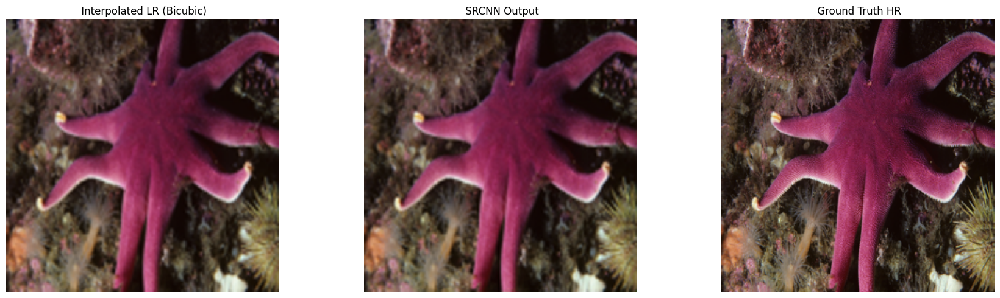

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

test_hr = hr_images[0]
lr_down = Image.fromarray((test_hr * 255).astype(np.uint8)).resize((128, 128), Image.BICUBIC)
lr_up = lr_down.resize((256, 256), Image.BICUBIC)
test_lr = np.array(lr_up).astype(np.float32) / 255.0
def super_resolve(model, lr_image):
    lr_image = np.expand_dims(lr_image, axis=0)
    sr_image = model.predict(lr_image)[0]
    return np.clip(sr_image, 0, 1)

model = load_model("srcnn_div2k.h5")
sr_image = super_resolve(srcnn_model, test_lr)
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow((test_lr * 255).astype(np.uint8))
plt.title(" Interpolated LR (Bicubic)")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow((sr_image * 255).astype(np.uint8))
plt.title(" SRCNN Output")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow((test_hr * 255).astype(np.uint8))
plt.title(" Ground Truth HR")
plt.axis("off")
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


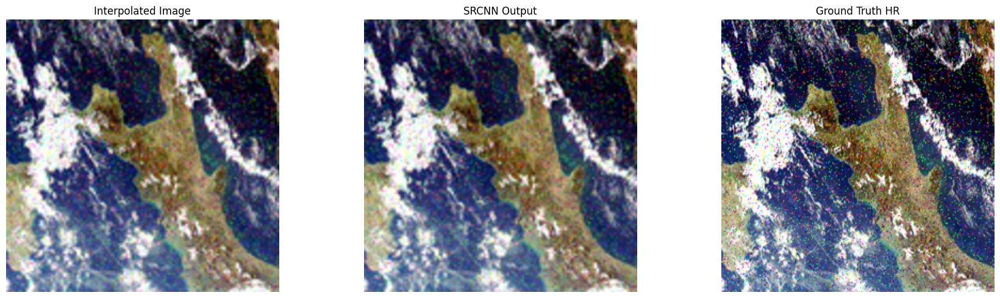

SRCNN Output vs HR:
  PSNR: 19.80 dB
  SSIM: 0.6510


In [62]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

image_path = "/content/satellite.png"
hr_img = Image.open(image_path).convert("RGB").resize((256, 256), Image.BICUBIC)
test_hr = np.array(hr_img).astype(np.float32) / 255.0
lr_down = hr_img.resize((128, 128), Image.BICUBIC)
lr_up = lr_down.resize((256, 256), Image.BICUBIC)
test_lr = np.array(lr_up).astype(np.float32) / 255.0
model = load_model("srcnn_div2k.h5")

def super_resolve(model, lr_image):
    lr_image = np.expand_dims(lr_image, axis=0)
    sr_image = model.predict(lr_image)[0]
    return np.clip(sr_image, 0, 1)
sr_image = super_resolve(model, test_lr)
test_lr_uint8 = (test_lr * 255).astype(np.uint8)
sr_image_uint8 = (sr_image * 255).astype(np.uint8)
test_hr_uint8 = (test_hr * 255).astype(np.uint8)
plt.figure(figsize=(18, 5))
plt.subplot(1, 3, 1)
plt.imshow(test_lr_uint8)
plt.title("Interpolated Image")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(sr_image_uint8)
plt.title("SRCNN Output")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(test_hr_uint8)
plt.title("Ground Truth HR")
plt.axis("off")
plt.tight_layout()
plt.show()

# Compute Metrics
psnr_bicubic = psnr(test_hr, test_lr, data_range=1.0)
ssim_bicubic = ssim(test_hr, test_lr, data_range=1.0, channel_axis=-1)
psnr_srcnn = psnr(test_hr, sr_image, data_range=1.0)
ssim_srcnn = ssim(test_hr, sr_image, data_range=1.0, channel_axis=-1)

# Print metrics
#print(f"Interpolated LR vs HR:\n  PSNR: {psnr_bicubic:.2f} dB\n  SSIM: {ssim_bicubic:.4f}")
print(f"SRCNN Output vs HR:\n  PSNR: {psnr_srcnn:.2f} dB\n  SSIM: {ssim_srcnn:.4f}")
